<h1 style="text-align: center; background-color : #1545C2; color : white ; padding : 20px ; margin:20px ; border-radius : 15px ">Car Price Prediction</h1>

## ***About Dataset***

> `This dataset contains information on various attributes of cars, with a focus on predicting car prices. The dataset is provided in a CSV file format with 19,237 rows and 18 columns. The Price column is the target variable for regression analysis, aiming to predict the selling price of cars based on other features.`

## ***Dataset Attribute Explanation***

* `ID`: A unique identifier for each car entry.

* `Price`: The selling price of the car (target column).

* `Levy`: A tax or surcharge imposed on the vehicle, possibly depending on age or fuel type.

* `Manufacturer`: The brand or company that produced the car (e.g., Toyota, BMW).

* `Model`: The specific model of the car (e.g., Corolla, 3 Series).

* `Prod. year`: The year the car was manufactured.

* `Category`: The type or classification of the car (e.g., SUV, sedan, hatchback).

* `Leather interior`: Indicates whether the car has a leather interior (Yes or No).

* `Fuel type`: The type of fuel used by the car (e.g., gasoline, diesel, electric).

* `Engine volume`: The volume of the car's engine, typically measured in liters (e.g., 1.6L).

* `Mileage`: The total distance the car has traveled, usually measured in kilometers or miles.

* `Cylinders`: The number of cylinders in the car's engine, affecting performance and fuel consumption.

* `Gear box type`: The type of transmission system used in the car (e.g., automatic, manual).

* `Drive wheels`: Indicates which wheels are driven by the engine (e.g., front-wheel drive, rear-wheel drive, all-wheel drive).

* `Doors`: The number of doors the car has (e.g., 2-door, 4-door).

* `Wheel`: Refers to the size or type of the wheels (e.g., alloy, steel).

* `Color`: The exterior color of the car (e.g., red, black, white).

* `Airbags`: The number of airbags the car has for safety.

### `Importing Libraries`

In [39]:
import pandas as pd
import numpy as np
from scipy import stats

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go

from sklearn.preprocessing import LabelEncoder

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from xgboost import XGBRegressor

from sklearn.metrics import r2_score, mean_squared_error

import warnings
warnings.filterwarnings('ignore')

### `Load the Data` 

In [40]:
df= pd.read_csv('car_price_prediction.csv')
df.head()

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,45654403,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12
1,44731507,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,04-May,Left wheel,Black,8
2,45774419,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,04-May,Right-hand drive,Black,2
3,45769185,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,04-May,Left wheel,White,0
4,45809263,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4


 ### `Exploratory Data Analysis (EDA)`

In [41]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19237 entries, 0 to 19236
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID                19237 non-null  int64  
 1   Price             19237 non-null  int64  
 2   Levy              19237 non-null  object 
 3   Manufacturer      19237 non-null  object 
 4   Model             19237 non-null  object 
 5   Prod. year        19237 non-null  int64  
 6   Category          19237 non-null  object 
 7   Leather interior  19237 non-null  object 
 8   Fuel type         19237 non-null  object 
 9   Engine volume     19237 non-null  object 
 10  Mileage           19237 non-null  object 
 11  Cylinders         19237 non-null  float64
 12  Gear box type     19237 non-null  object 
 13  Drive wheels      19237 non-null  object 
 14  Doors             19237 non-null  object 
 15  Wheel             19237 non-null  object 
 16  Color             19237 non-null  object

In [42]:
df.describe()

,ID,Price,Prod. year,Cylinders,Airbags
count,1.923700e+04,1.923700e+04,19237.000000,19237.000000,19237.000000
mean,4.557654e+07,1.855593e+04,2010.912824,4.582991,6.582627
std,9.365914e+05,1.905813e+05,5.668673,1.199933,4.320168
min,2.074688e+07,1.000000e+00,1939.000000,1.000000,0.000000
25%,4.569837e+07,5.331000e+03,2009.000000,4.000000,4.000000
50%,4.577231e+07,1.317200e+04,2012.000000,4.000000,6.000000
75%,4.580204e+07,2.207500e+04,2015.000000,4.000000,12.000000
max,4.581665e+07,2.630750e+07,2020.000000,16.000000,16.000000


In [43]:
df.duplicated().sum()

313

In [44]:
df.drop_duplicates(inplace=True)

In [45]:
category_cols = df.select_dtypes(include=['object'])
for col in category_cols:
    print(col)
    print(df[col].value_counts())
    print('------------------------------------------------------')

Levy
-       5709
765      482
891      453
639      403
640      398
        ... 
3156       1
2908       1
1279       1
1719       1
1901       1
Name: Levy, Length: 559, dtype: int64
------------------------------------------------------
Manufacturer
HYUNDAI          3729
TOYOTA           3606
MERCEDES-BENZ    2043
FORD             1088
CHEVROLET        1047
                 ... 
TESLA               1
PONTIAC             1
SATURN              1
ASTON MARTIN        1
GREATWALL           1
Name: Manufacturer, Length: 65, dtype: int64
------------------------------------------------------
Model
Prius                     1069
Sonata                    1067
Camry                      929
Elantra                    910
E 350                      534
                          ... 
1500,1600 Schtufenheck       1
E 420                        1
C 250 luxury                 1
Passat sport                 1
Prius C aqua                 1
Name: Model, Length: 1590, dtype: int64
-----------------

In [46]:
df['Manufacturer'].unique()

array(['LEXUS', 'CHEVROLET', 'HONDA', 'FORD', 'HYUNDAI', 'TOYOTA',
       'MERCEDES-BENZ', 'OPEL', 'PORSCHE', 'BMW', 'JEEP', 'VOLKSWAGEN',
       'AUDI', 'RENAULT', 'NISSAN', 'SUBARU', 'DAEWOO', 'KIA',
       'MITSUBISHI', 'SSANGYONG', 'MAZDA', 'GMC', 'FIAT', 'INFINITI',
       'ALFA ROMEO', 'SUZUKI', 'ACURA', 'LINCOLN', 'VAZ', 'GAZ',
       'CITROEN', 'LAND ROVER', 'MINI', 'DODGE', 'CHRYSLER', 'JAGUAR',
       'ISUZU', 'SKODA', 'DAIHATSU', 'BUICK', 'TESLA', 'CADILLAC',
       'PEUGEOT', 'BENTLEY', 'VOLVO', 'სხვა', 'HAVAL', 'HUMMER', 'SCION',
       'UAZ', 'MERCURY', 'ZAZ', 'ROVER', 'SEAT', 'LANCIA', 'MOSKVICH',
       'MASERATI', 'FERRARI', 'SAAB', 'LAMBORGHINI', 'ROLLS-ROYCE',
       'PONTIAC', 'SATURN', 'ASTON MARTIN', 'GREATWALL'], dtype=object)

## Things to Fix

*   > `Levy`: Address any issues with the '-' character in this column. It might need to be handled or replaced to ensure consistency.
*   > `Engine Volume`: Check the data type of this column and ensure it's correctly formatted as a numerical value.
*   > `Mileage`: Remove the 'km' suffix from the mileage values and convert the data type to a numerical format.
*   > `Doors`: Ensure the data type for the number of doors is correctly specified and consistent across the dataset.


In [47]:
df['Levy']= df['Levy'].replace('-', 0)
df['Levy'] = pd.to_numeric(df['Levy'], errors='coerce')

In [48]:
df['Engine volume'] = df['Engine volume'].str.replace(' Turbo', '', regex=False)
df['Engine volume'] = pd.to_numeric(df['Engine volume'], errors='coerce')

In [49]:
df['Mileage'] = df['Mileage'].str.replace(' km', '', regex=False)
df['Mileage'] = pd.to_numeric(df['Mileage'], errors='coerce')

In [50]:
df['Doors'] = df['Doors'].replace({
    '04-May': 4,
    '02-Mar': 2,
    '>5': 6
})

df['Doors'] = pd.to_numeric(df['Doors'], errors='coerce')

In [51]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 18924 entries, 0 to 19236
Data columns (total 18 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   ID                18924 non-null  int64  
 1   Price             18924 non-null  int64  
 2   Levy              18924 non-null  int64  
 3   Manufacturer      18924 non-null  object 
 4   Model             18924 non-null  object 
 5   Prod. year        18924 non-null  int64  
 6   Category          18924 non-null  object 
 7   Leather interior  18924 non-null  object 
 8   Fuel type         18924 non-null  object 
 9   Engine volume     18924 non-null  float64
 10  Mileage           18924 non-null  int64  
 11  Cylinders         18924 non-null  float64
 12  Gear box type     18924 non-null  object 
 13  Drive wheels      18924 non-null  object 
 14  Doors             18924 non-null  int64  
 15  Wheel             18924 non-null  object 
 16  Color             18924 non-null  object

### `Distribution of Categorical Columns`
* > In this step, I am visualizing the distribution of each categorical column in the dataset using horizontal bar plots. The process includes:
* > 1. **`Identifying Categorical Columns`**: First, I identify all columns with categorical data types.
* > 2. **`Calculating Counts and Percentages`**: For each categorical column, I compute the count and percentage of each category.
* > 3. **`Plotting`**: I create horizontal bar plots to represent the count of each category, using the `seaborn` library for visualization. Each bar represents the count of a specific category, and the plot also annotates each bar with the corresponding percentage of the total.
* > 4. **`Annotations and Formatting`**: The plot includes annotations showing the percentage of each category, and the x-axis labels are rotated for better readability.

* > This approach provides a clear view of the distribution of categories within each categorical column, making it easier to understand the dataset's composition.



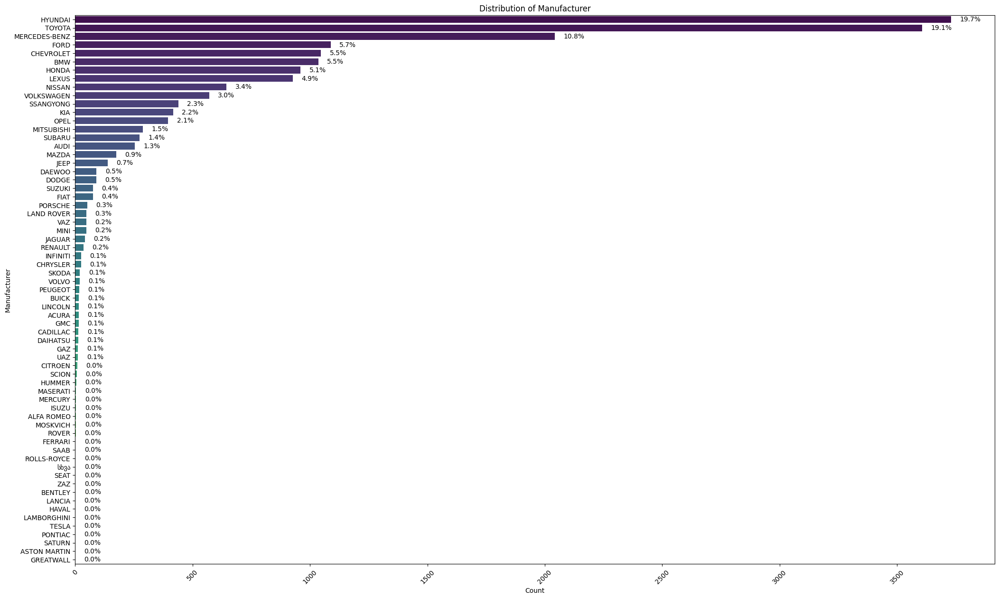

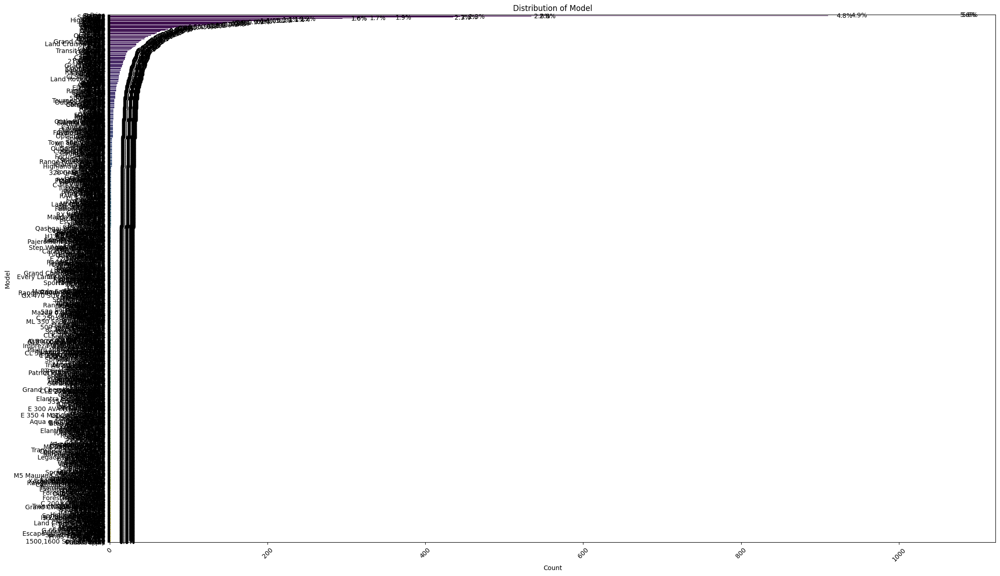

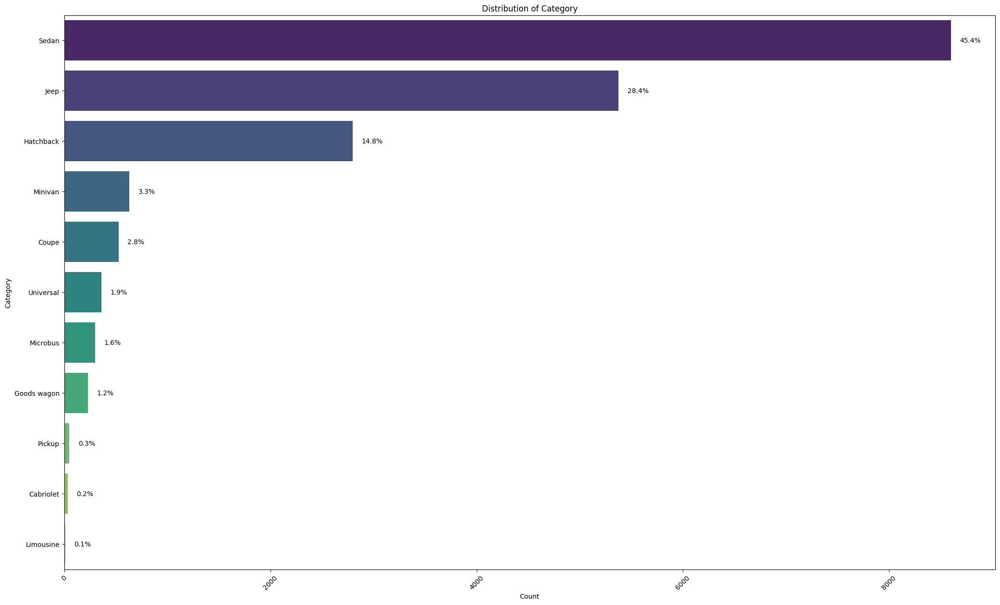

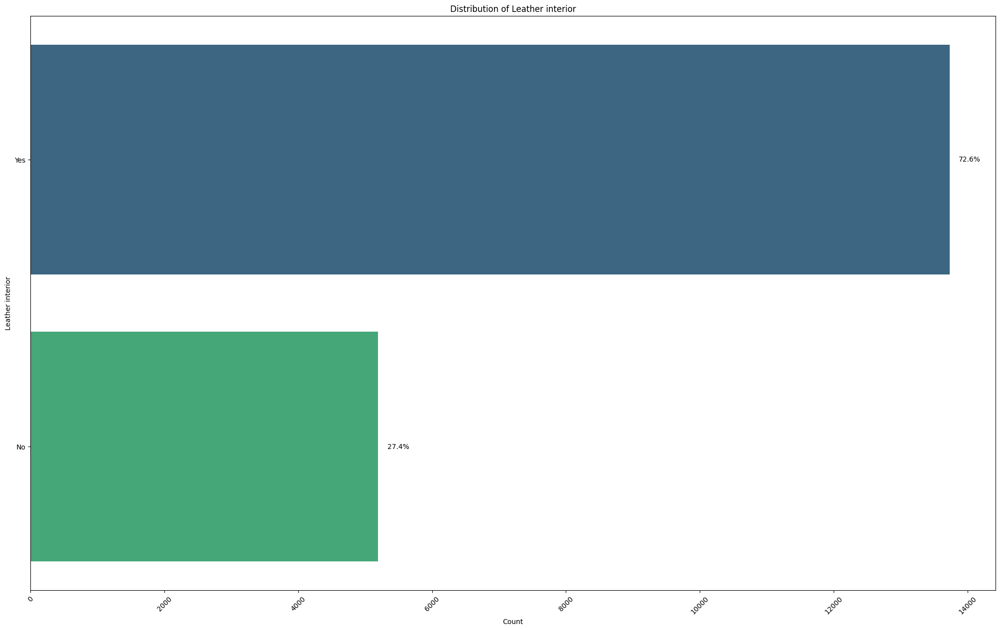

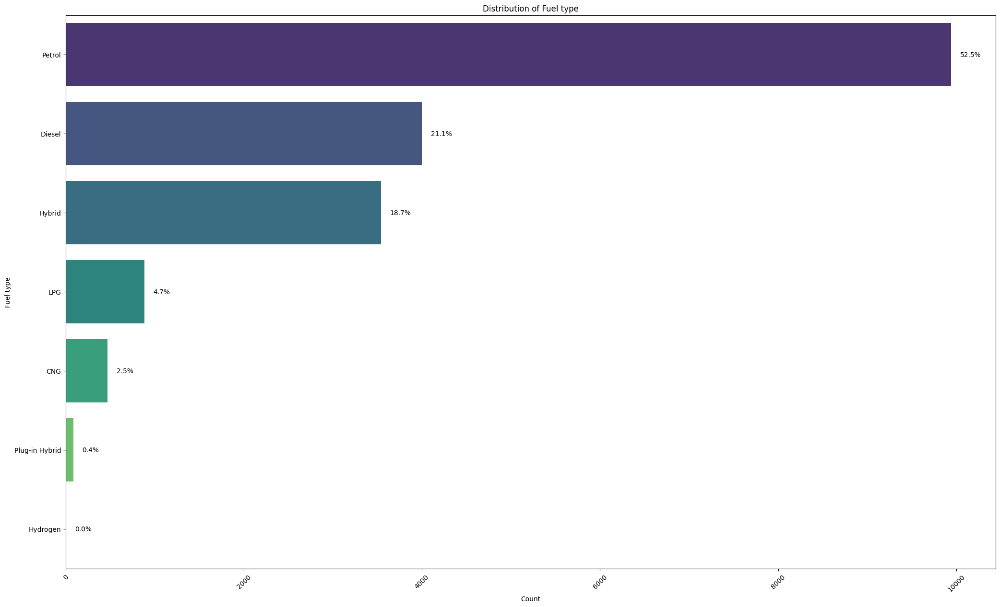

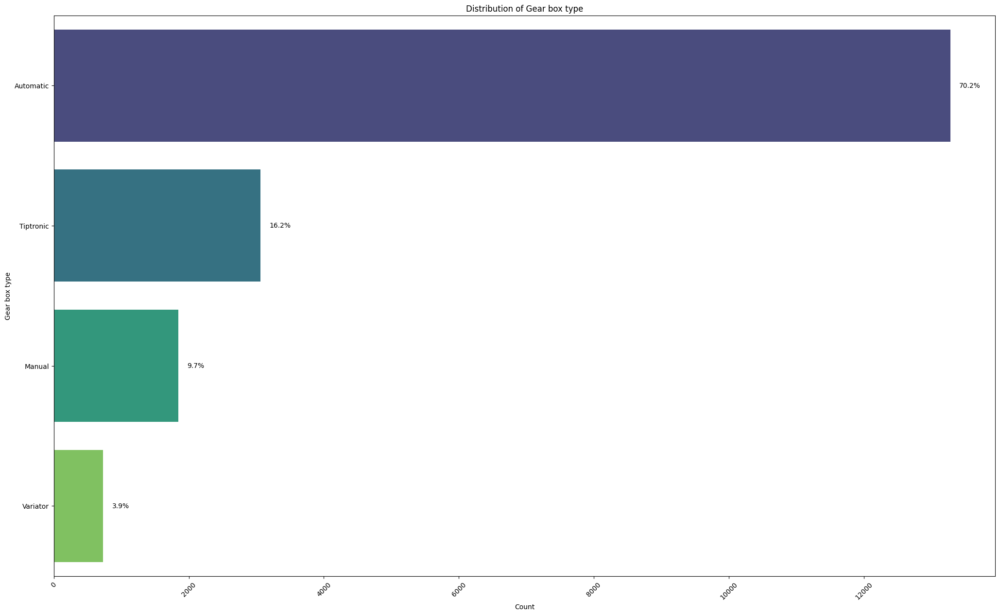

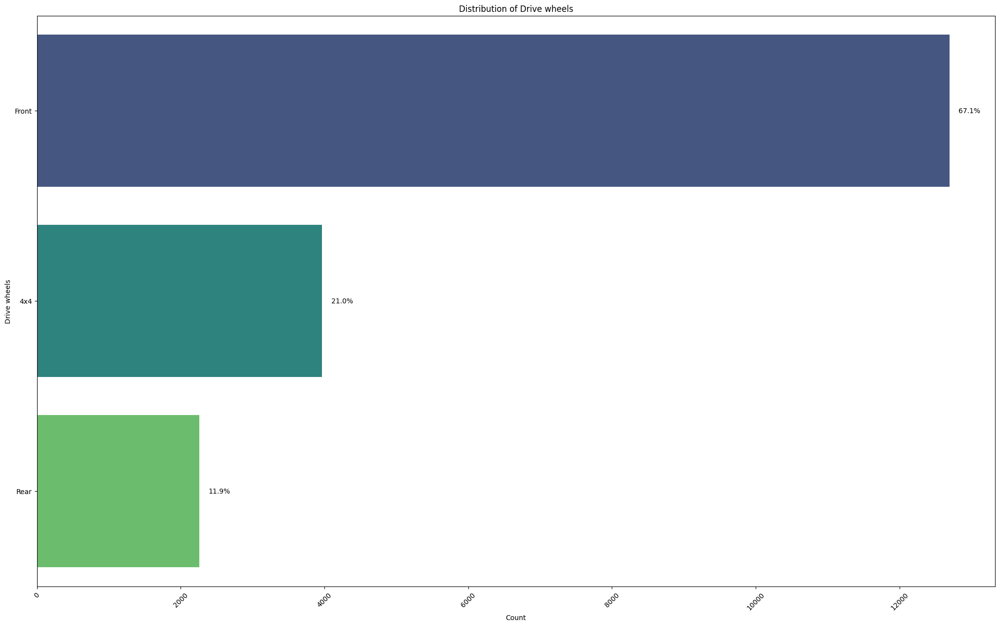

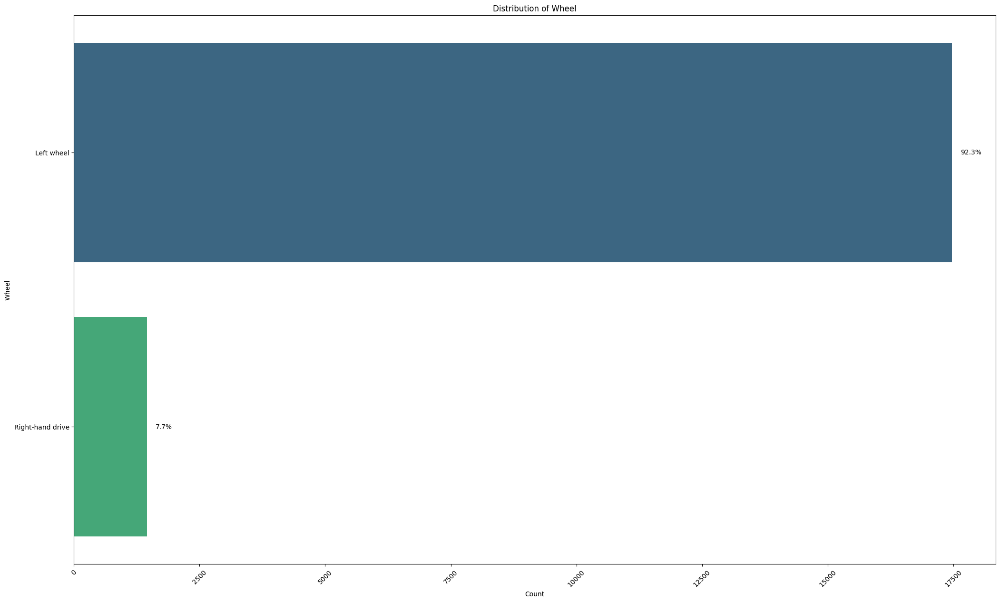

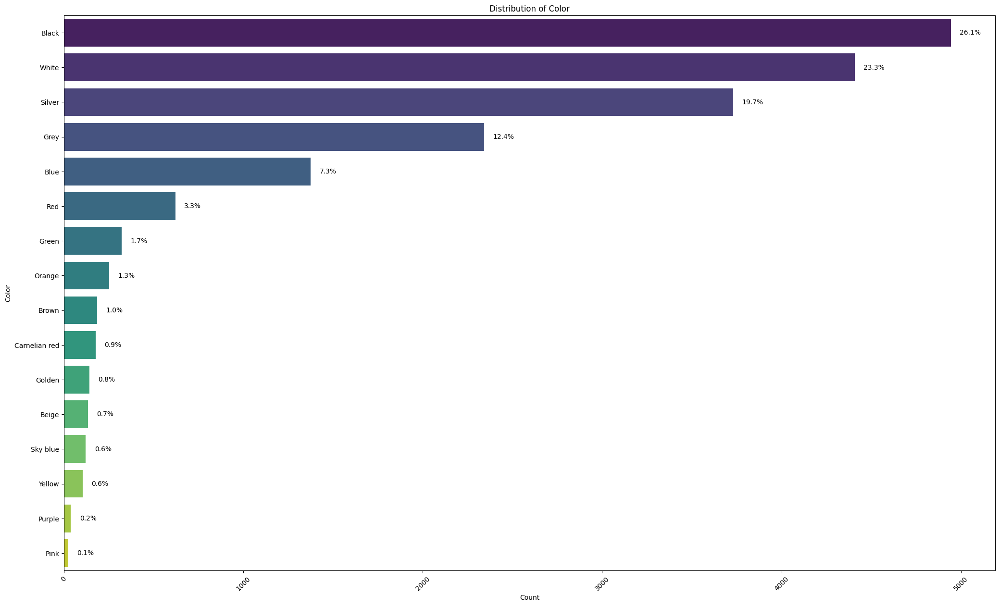

In [52]:
def plot_all_category_distributions(df):
    
    # Identify categorical columns
    category_cols = df.select_dtypes(include=['object', 'category'])
    
    for column in category_cols.columns:
        plt.figure(figsize=(25, 15))
        
        # Get the counts and corresponding categories
        counts = df[column].value_counts()
        total = counts.sum()
        
        # Create a DataFrame for plotting
        plot_data = counts.reset_index()
        plot_data.columns = [column, 'Count']
        plot_data['Percentage'] = (plot_data['Count'] / total) * 100
        
        # Plot horizontal bar plot
        sns.barplot(data=plot_data, y=column, x='Count', palette='viridis')
        
        # Annotate with percentages
        for i in range(len(plot_data)):
            plt.text(
                x=plot_data['Count'].iloc[i] + plot_data['Count'].max() * 0.01, 
                y=i, 
                s=f"{plot_data['Percentage'].iloc[i]:.1f}%", 
                va='center'
            )
        
        plt.title(f'Distribution of {column}')
        plt.xlabel('Count')
        plt.ylabel(column)
        plt.xticks(rotation=45)
        plt.show()

plot_all_category_distributions(df)

* > `Comment: In the plot for the `Model` column, we can see that there are approximately 1500 unique values. This high cardinality makes the visualization challenging and cluttered. Due to the sheer number of unique models, the plot may not be very informative and can appear overloaded with information.`


..........................................................................................................................................................................................................................................

### `Model Distribution by Category`
* > In this section, I am visualizing the distribution of car models within each category using a treemap plot. The process involves:
* > 1. **Filtering by Category**: For each unique category in the specified column, I filter the dataset to include only the rows corresponding to that category.
* > 2. **Creating Treemaps**: I generate a treemap plot for each category to visualize the distribution of car models within that category. The treemap helps to show the hierarchical relationship between categories and models, where each rectangle represents a model, and its size reflects its proportion within the category.
* > 3. **Color Scale**: I use a custom color scale (`'33'`) to differentiate between models, and I include annotations showing the label and percentage of each model.
* > This approach provides an interactive view of how car models are distributed across different categories, making it easier to analyze the composition of each category.


In [53]:
def plot_model_distribution_by_category_separately(df,col):

    categories = df[col].unique()

    for category in categories:
        filtered_df = df[df[col] == category]
        
        fig = px.treemap(filtered_df, 
                         path=[col, 'Model'], 
                         color_continuous_scale='deep',
                         title=f'Model Distribution in {category}',
                         labels={'Model': 'Car Model', col: 'Car Category'},
                         color='Model',
                         )
        
        fig.update_traces(textinfo="label+percent entry")
        fig.show()

In [54]:
plot_model_distribution_by_category_separately(df,'Category')

In [55]:
plot_model_distribution_by_category_separately(df,'Manufacturer')

* > `The Tree Maps help visualize how car models are distributed across different categories (e.g., Sedan, SUV, etc.) and ManuManufacturers. This helps in understanding the variety of models available within each category or Manufacturer and identifying which models are more common or less prevalent.`

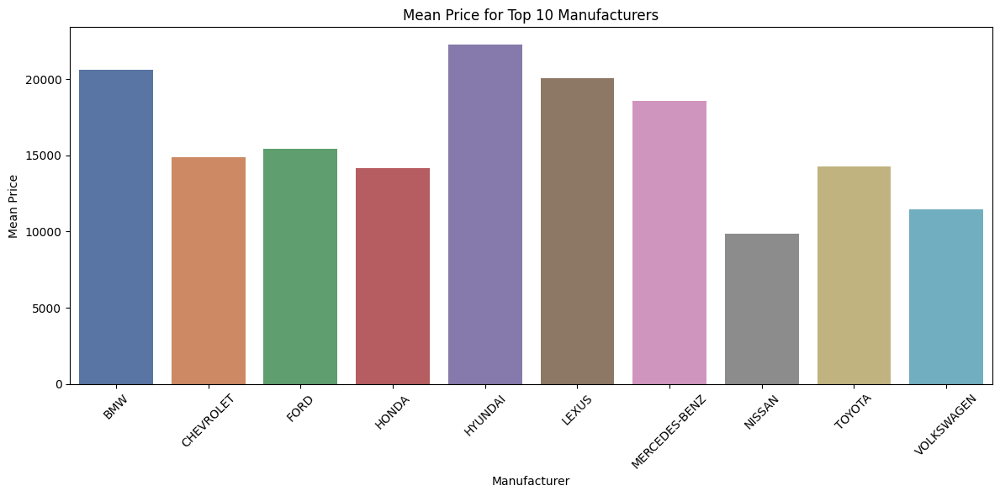

In [56]:
top_manufacturers = df['Manufacturer'].value_counts().nlargest(10).index
mean_prices = df[df['Manufacturer'].isin(top_manufacturers)].groupby('Manufacturer')['Price'].mean()

plt.figure(figsize=(12, 6))
sns.barplot(x=mean_prices.index, y=mean_prices.values, palette='deep')
plt.title('Mean Price for Top 10 Manufacturers')
plt.xlabel('Manufacturer')
plt.ylabel('Mean Price')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

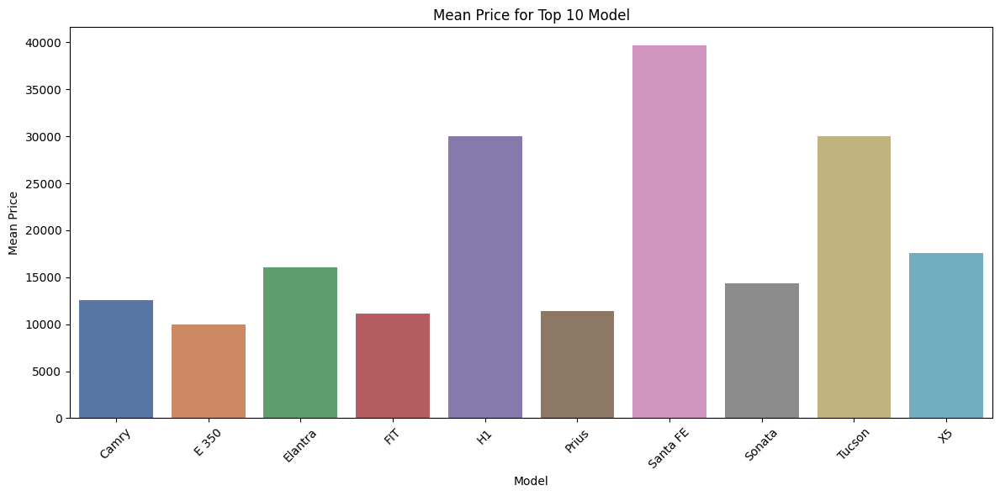

In [57]:
top_Models = df['Model'].value_counts().nlargest(10).index
mean_prices = df[df['Model'].isin(top_Models)].groupby('Model')['Price'].mean()

plt.figure(figsize=(12, 6))
sns.barplot(x=mean_prices.index, y=mean_prices.values, palette='deep')
plt.title('Mean Price for Top 10 Model')
plt.xlabel('Model')
plt.ylabel('Mean Price')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

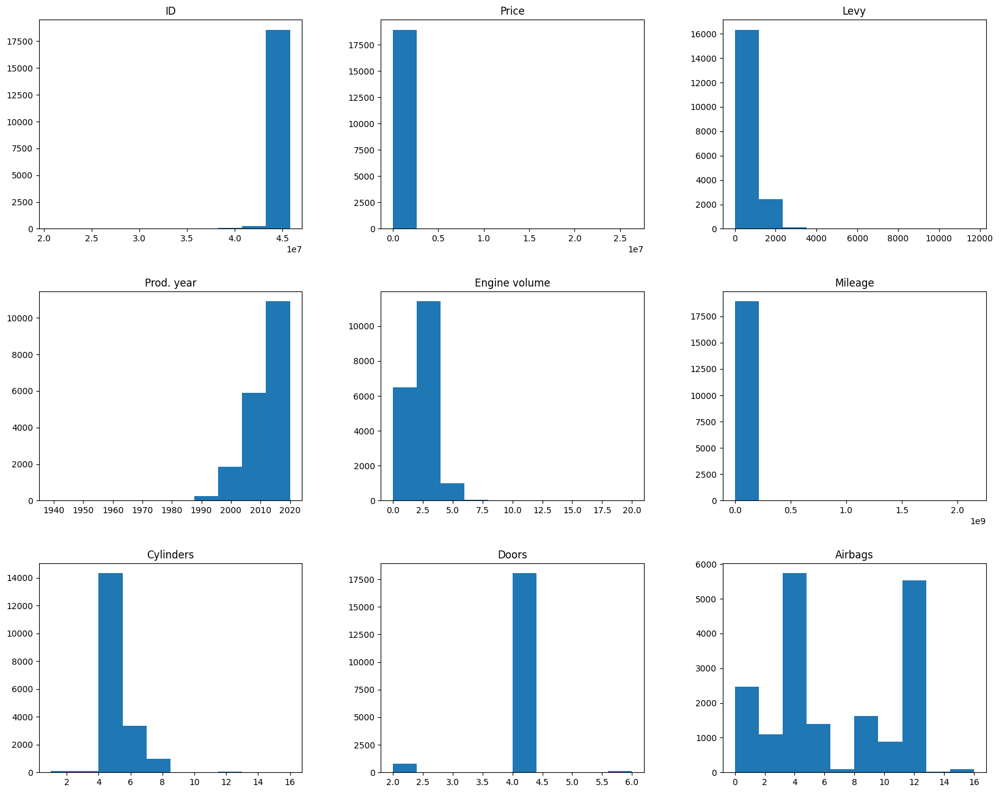

In [58]:
df.hist(figsize=(20,16), grid= False);

### `Boxplot of Numeric Columns `
* > This section visualizes the distribution of numeric columns in the dataset using boxplots. The function `plot_numeric_boxplots_plotly` performs the following steps:
* > - **Selecting Numeric Columns**: It identifies all numeric columns (`float64` and `int64`) in the dataset.
* > - **Creating Boxplots**: For each numeric column, a boxplot is generated using Plotly. The boxplot shows the distribution of the data, including median, quartiles, and potential outliers.
* > - **Customization**: The boxplot's title is centered, and a specific color (`#ffa600`) is used for the boxplot elements.
* > This visualization provides insights into the spread and skewness of the numeric features, as well as identifying any outliers in the data.


In [59]:
def plot_numeric_boxplots_plotly(df):
    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    
    for col in numeric_columns:
        fig = px.box(df, x=col, title=f'{col} Boxplot',
                     labels={col: col}, color_discrete_sequence=['#ffa600'])
        
        fig.update_layout(title_x=0.5) 
        fig.show()


plot_numeric_boxplots_plotly(df)


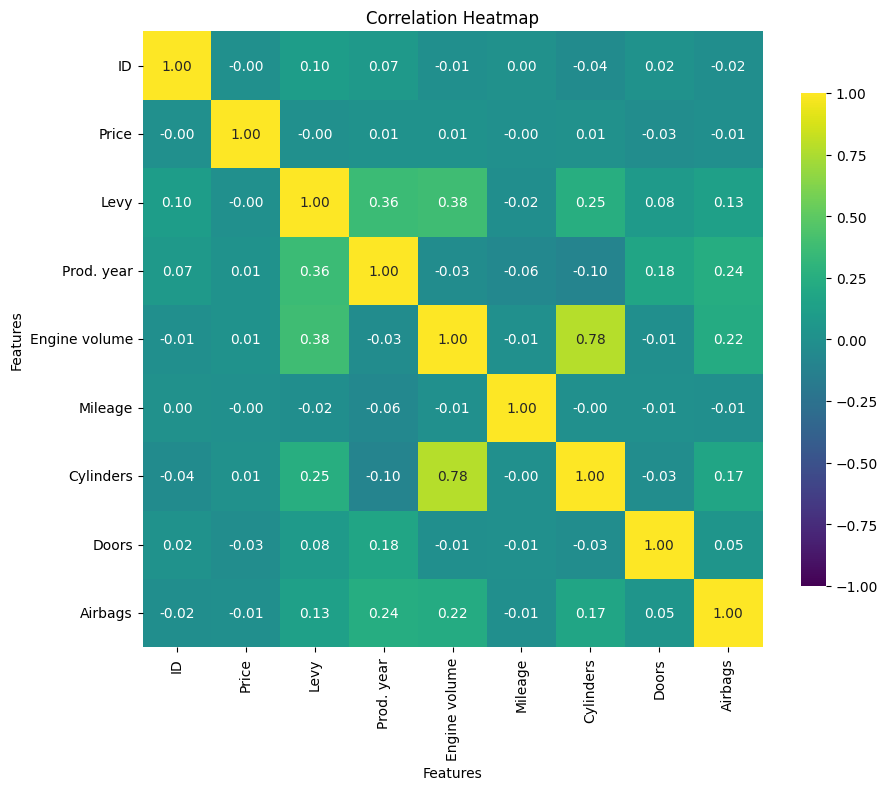

In [60]:
corr = df.corr()

plt.figure(figsize=(10, 8))  
sns.heatmap(corr,            
            annot=True,      
            cmap='viridis',   
            fmt='.2f',        
            vmin=-1, vmax=1,  
            cbar_kws={"shrink": .8}  
           )

plt.title('Correlation Heatmap')
plt.xlabel('Features')
plt.ylabel('Features')

plt.show()

## Feature Analysis Using ANOVA

To determine how various categorical features affect the target variable (car price), we performed ANOVA (Analysis of Variance) tests. ANOVA helps us identify whether there are statistically significant differences in the mean car prices across different categories of a feature.

### Steps Involved:
1. **Selecting Features**: We selected several categorical features including `Manufacturer`, `Model`, `Category`, `Leather interior`, `Fuel type`, `Gear box type`, `Drive wheels`, `Wheel`, and `Color`.
2. **ANOVA Testing**: For each feature, we performed an ANOVA test to evaluate the impact of that feature on the car price.
3. **Interpreting Results**: The F-value and p-value are used to determine the significance of the feature:
   - **F-value**: Represents the ratio of variance between the groups to the variance within the groups. Higher values suggest greater between-group variance.
   - **p-value**: If the p-value is less than a chosen significance level (commonly 0.05), the feature is considered to have a statistically significant effect on the price.

Below is the Python code to perform the ANOVA tests on the selected features and the results for each feature.


In [61]:
def anova_test(df, target):
    categorical_cols = df.select_dtypes(include='object').columns
    results = {}
    
    for col in categorical_cols:
        groups = [df[target][df[col] == category] for category in df[col].unique()]
        f_value, p_value = stats.f_oneway(*groups)
        
        results[col] = {'F-value': f_value, 'p-value': p_value}
        
    return results

anova_results = anova_test(df, 'Price')

for col, result in anova_results.items():
    print(f"ANOVA for {col}: F-value = {result['F-value']}, p-value = {result['p-value']}")


ANOVA for Manufacturer: F-value = 1.0784692188345681, p-value = 0.31196074182795647
ANOVA for Model: F-value = 0.3673560187574055, p-value = 0.9999999999999999
ANOVA for Category: F-value = 8.352764448808571, p-value = 1.0977382738805408e-13
ANOVA for Leather interior: F-value = 0.005743615723611817, p-value = 0.9395896416698089
ANOVA for Fuel type: F-value = 4.019016774906249, p-value = 0.0005003195223169007
ANOVA for Gear box type: F-value = 3.431715507418443, p-value = 0.016235737783921872
ANOVA for Drive wheels: F-value = 0.10354159889939824, p-value = 0.9016390256674808
ANOVA for Wheel: F-value = 4.0112767615573555, p-value = 0.04521115121963431
ANOVA for Color: F-value = 0.7914573264273236, p-value = 0.6886746310455041


In [62]:
df.drop('ID',axis=1, inplace=True)

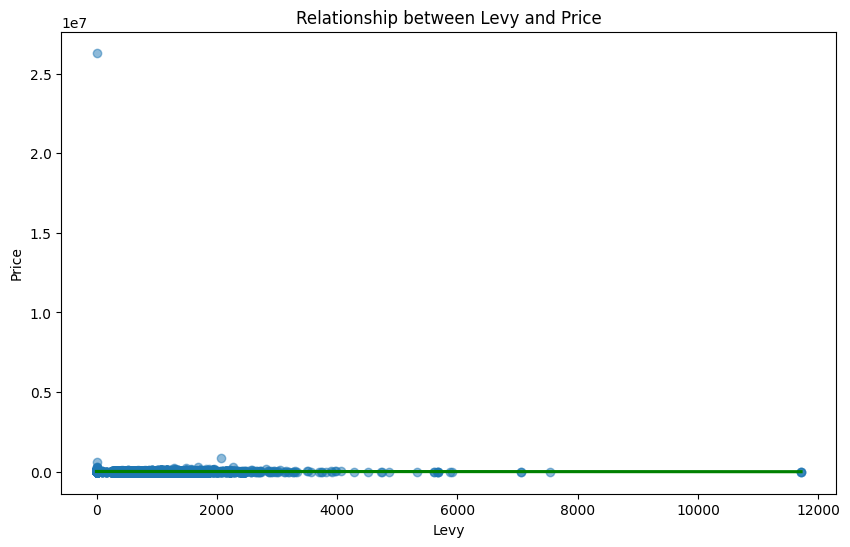

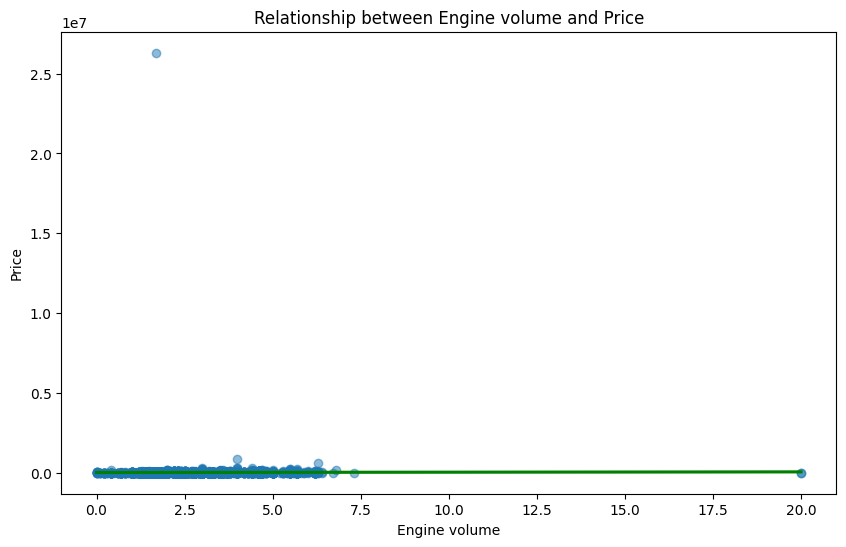

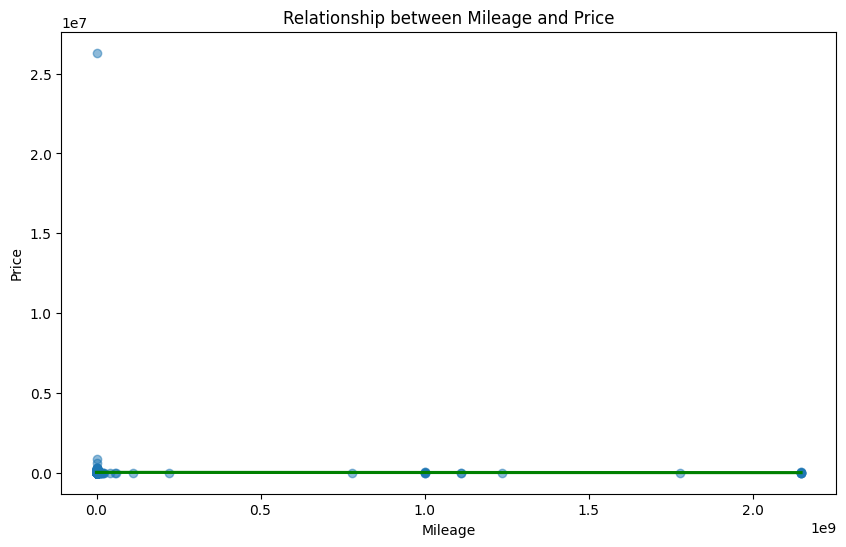

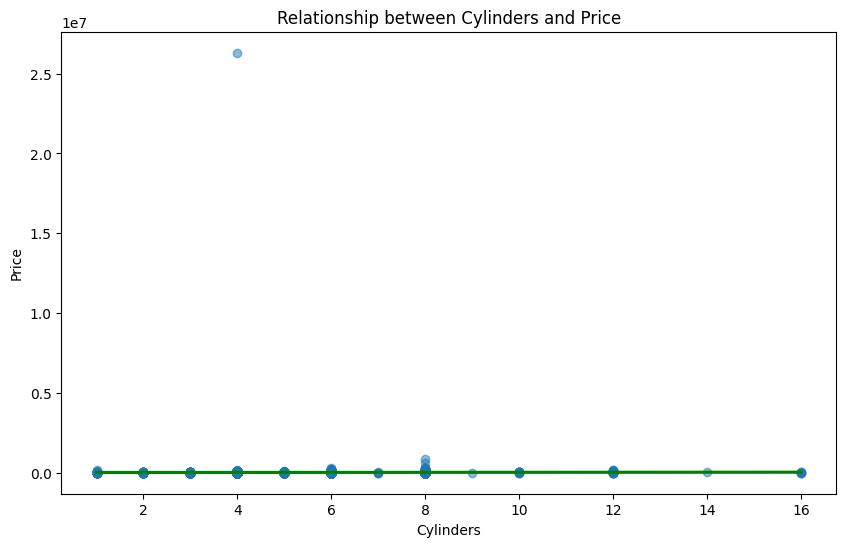

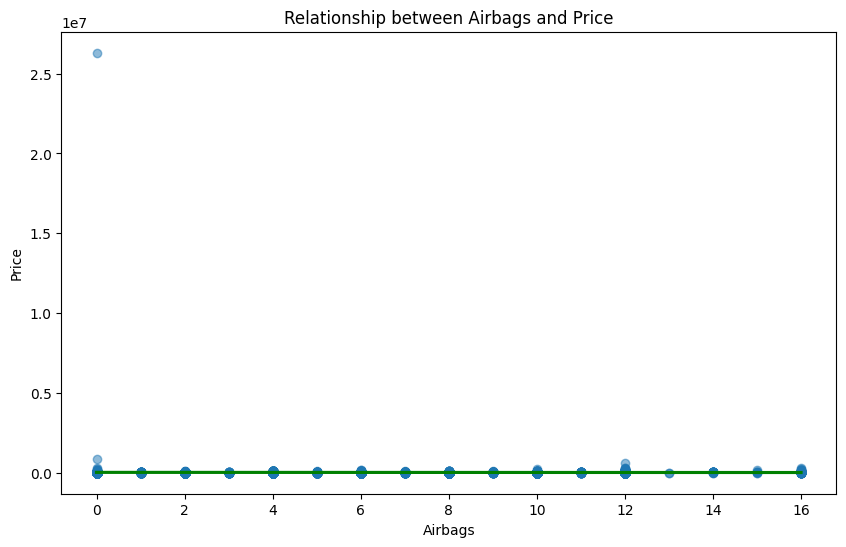

In [63]:
def plot_numerical_vs_target(df, num_feature, target):
    
    plt.figure(figsize=(10, 6))
    sns.regplot(data=df, x=num_feature, y=target, scatter_kws={'alpha':0.5}, line_kws={'color':'g'})
    plt.title(f'Relationship between {num_feature} and {target}')
    plt.xlabel(num_feature)
    plt.ylabel(target)
    plt.show()

for col in  ['Levy','Engine volume', 'Mileage',
       'Cylinders', 'Airbags']:
     plot_numerical_vs_target(df, col , 'Price')

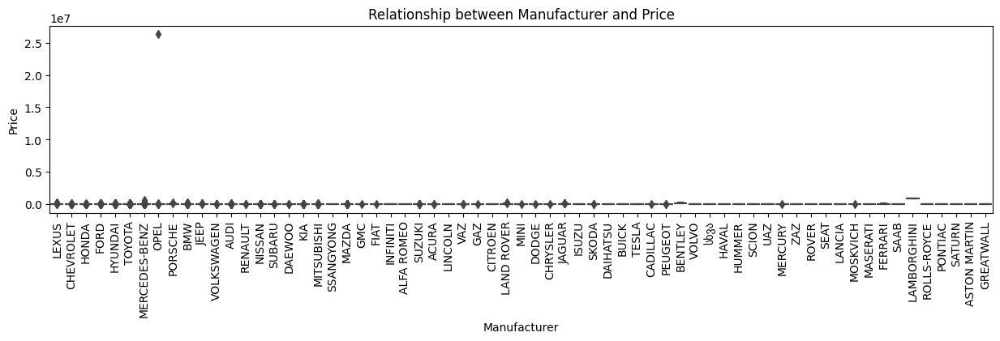

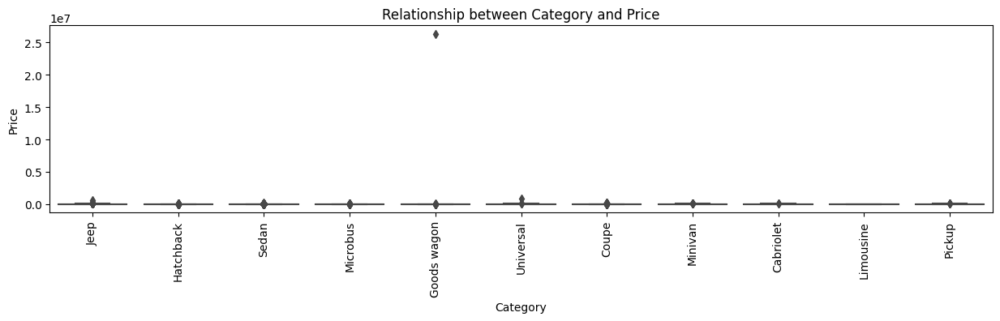

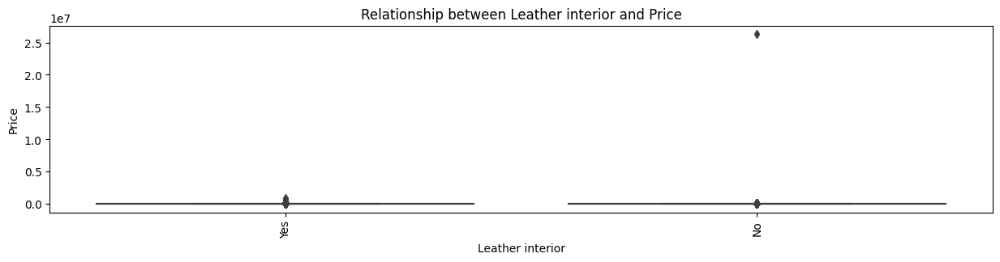

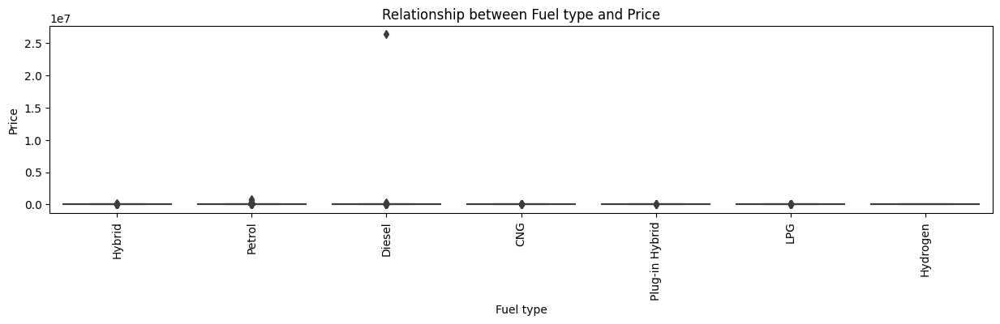

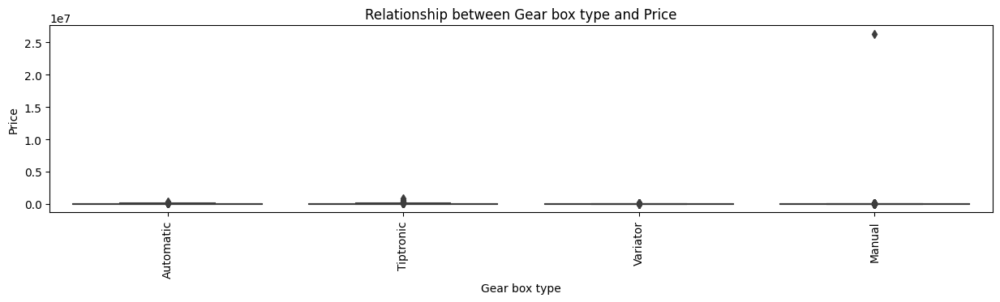

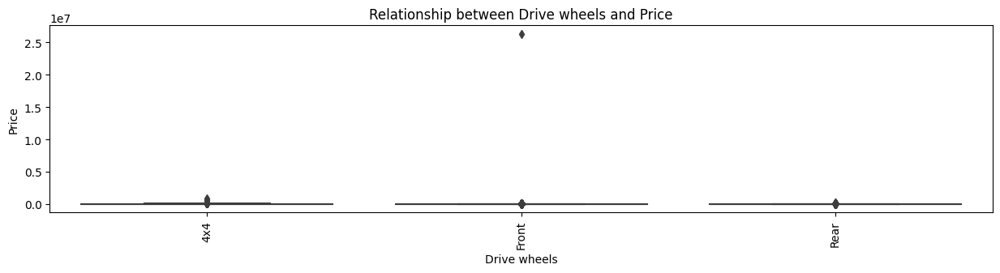

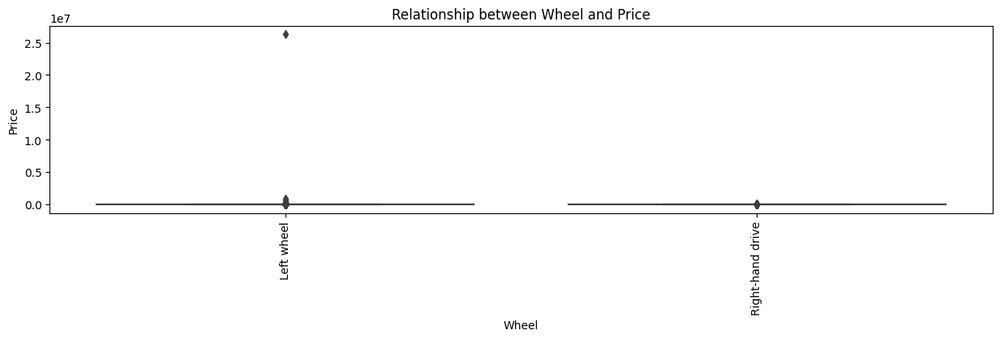

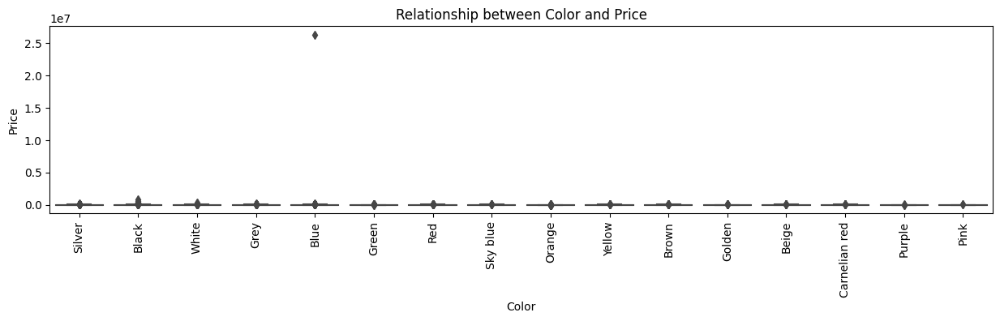

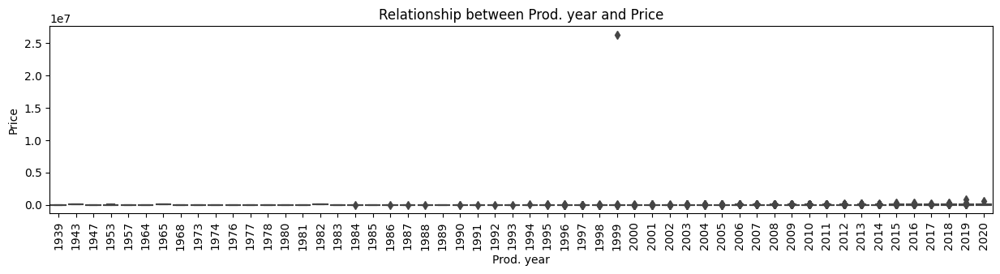

In [64]:
def plot_categorical_vs_target(df, cat_feature, target):

    plt.figure(figsize=(15, 3))
    sns.boxplot(data=df, x=cat_feature, y=target)
    plt.title(f'Relationship between {cat_feature} and {target}')
    plt.xlabel(cat_feature)
    plt.ylabel(target)
    plt.xticks(rotation=90) 
    plt.show()

for col in  ['Manufacturer','Category', 'Leather interior', 'Fuel type',
       'Gear box type', 'Drive wheels', 'Wheel', 'Color','Prod. year']:
     plot_categorical_vs_target(df, col , 'Price')

###  `Feature Engineering`

In [65]:
import datetime

dnow= datetime.datetime.now()
df['Car age']= dnow.year- df['Prod. year']

df.drop('Prod. year', axis=1, inplace=True)

### `Handle Outliers`

In [66]:
num_cols = df.select_dtypes(include=['float64', 'int64']).columns

for column in num_cols:
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers = df[(df[column] < lower_bound) | (df[column] > upper_bound)]

    num_outliers = outliers.shape[0]
    total_entries = df.shape[0]
    percentage_outliers = (num_outliers / total_entries) * 100

    print(f"Detected outliers for {column}: {num_outliers} outliers ({percentage_outliers:.2f}%)")
    
    if num_outliers > 0:
        df = df.loc[(df[column] <= upper_bound) & (df[column] >= lower_bound)]


Detected outliers for Price: 1055 outliers (5.57%)
Detected outliers for Levy: 161 outliers (0.90%)
Detected outliers for Engine volume: 1034 outliers (5.84%)
Detected outliers for Mileage: 637 outliers (3.82%)
Detected outliers for Cylinders: 3127 outliers (19.50%)
Detected outliers for Doors: 502 outliers (3.89%)
Detected outliers for Airbags: 0 outliers (0.00%)
Detected outliers for Car age: 900 outliers (7.25%)


###  `Data Encoding `

In [67]:
cat_cols = df.select_dtypes(include=['object']).columns 
num_cols= df.select_dtypes(exclude=['object']).columns

encoded_df = df.copy()

la = LabelEncoder()

for col in cat_cols:
    encoded_df[col+'encoded'] = la.fit_transform(df[col]) 


In [71]:
cat_cols = df.select_dtypes(include=['object']).columns 
num_cols = df.select_dtypes(exclude=['object']).columns

encoded_df = df.copy()

la = LabelEncoder()

for col in cat_cols:
    encoded_df[col + '_encoded'] = la.fit_transform(df[col])

end_df= encoded_df.drop(columns=['Manufacturer', 'Model', 'Category', 'Leather interior', 'Fuel type',
       'Gear box type', 'Drive wheels', 'Wheel', 'Color'])

end_df

,Price,Levy,Engine volume,Mileage,Cylinders,Doors,Airbags,Car age,Manufacturer_encoded,Model_encoded,Category_encoded,Leather interior_encoded,Fuel type_encoded,Gear box type_encoded,Drive wheels_encoded,Wheel_encoded,Color_encoded
2,8467,0,1.3,200000,4.0,4,2,18,15,316,3,0,4,3,1,1,1
3,3607,862,2.5,168966,4.0,4,0,13,12,304,4,1,2,0,0,0,14
4,11726,446,1.3,91901,4.0,4,4,10,15,316,3,1,4,0,1,0,12
5,39493,891,2.0,160931,4.0,4,4,8,16,639,4,1,1,0,1,0,14
6,1803,761,1.8,258909,4.0,4,12,14,42,575,3,1,2,0,1,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19230,470,645,1.8,307325,4.0,4,12,13,42,575,3,1,2,0,1,0,12
19233,15681,831,2.4,161600,4.0,4,8,13,16,653,8,1,4,2,1,0,11
19234,26108,836,2.0,116365,4.0,4,4,14,16,722,4,1,1,0,1,0,7
19235,5331,1288,2.0,51258,4.0,4,4,17,6,189,4,1,1,0,1,0,1


In [72]:
end_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11508 entries, 2 to 19236
Data columns (total 17 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Price                     11508 non-null  int64  
 1   Levy                      11508 non-null  int64  
 2   Engine volume             11508 non-null  float64
 3   Mileage                   11508 non-null  int64  
 4   Cylinders                 11508 non-null  float64
 5   Doors                     11508 non-null  int64  
 6   Airbags                   11508 non-null  int64  
 7   Car age                   11508 non-null  int64  
 8   Manufacturer_encoded      11508 non-null  int32  
 9   Model_encoded             11508 non-null  int32  
 10  Category_encoded          11508 non-null  int32  
 11  Leather interior_encoded  11508 non-null  int32  
 12  Fuel type_encoded         11508 non-null  int32  
 13  Gear box type_encoded     11508 non-null  int32  
 14  Drive 

##  `Data Splitting `

In [73]:
X = end_df.drop(columns= ['Price'])  
y = end_df['Price'] 

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f'Train shape: {X_train.shape}, Test shape: {X_test.shape}')

Train shape: (9206, 16), Test shape: (2302, 16)


### `Modelling`

In [74]:
models = {
    'Random Forest': RandomForestRegressor(),
    'Decision Tree': DecisionTreeRegressor(),
    'XGBoost': XGBRegressor(),
    'Gradient Boosting': GradientBoostingRegressor(),
}

# Train and evaluate models
for key, model in models.items():
    print(f'For {key} Model:')
    print('_' * 90)
    
    # Fit the model
    model.fit(X_train, y_train)
    
    # Make predictions
    y_pred = model.predict(X_test)
    
    # Calculate metrics
    r2 = r2_score(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    score= model.score(X_test, y_test
                      )
    
    print(f"R² Score: {r2:.6f}")
    print(f"RMSE: {rmse:.6f}\n")
    print(f"score: {score:.6f}\n")



For Random Forest Model:
__________________________________________________________________________________________
R² Score: 0.798337
RMSE: 5168.932288

score: 0.798337

For Decision Tree Model:
__________________________________________________________________________________________
R² Score: 0.595404
RMSE: 7321.462715

score: 0.595404

For XGBoost Model:
__________________________________________________________________________________________
R² Score: 0.775175
RMSE: 5457.695938

score: 0.775175

For Gradient Boosting Model:
__________________________________________________________________________________________
R² Score: 0.676469
RMSE: 6547.046535

score: 0.676469



In [75]:
import pickle

In [76]:
file_name = 'Car_prediction.sav'

In [77]:
pickle.dump(models['Random Forest'],open(file_name,'wb'))

### `Analysis needed for deployment`

In [78]:
encoded_df

,Price,Levy,Manufacturer,Model,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,...,Car age,Manufacturer_encoded,Model_encoded,Category_encoded,Leather interior_encoded,Fuel type_encoded,Gear box type_encoded,Drive wheels_encoded,Wheel_encoded,Color_encoded
2,8467,0,HONDA,FIT,Hatchback,No,Petrol,1.3,200000,4.0,...,18,15,316,3,0,4,3,1,1,1
3,3607,862,FORD,Escape,Jeep,Yes,Hybrid,2.5,168966,4.0,...,13,12,304,4,1,2,0,0,0,14
4,11726,446,HONDA,FIT,Hatchback,Yes,Petrol,1.3,91901,4.0,...,10,15,316,3,1,4,0,1,0,12
5,39493,891,HYUNDAI,Santa FE,Jeep,Yes,Diesel,2.0,160931,4.0,...,8,16,639,4,1,1,0,1,0,14
6,1803,761,TOYOTA,Prius,Hatchback,Yes,Hybrid,1.8,258909,4.0,...,14,42,575,3,1,2,0,1,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19230,470,645,TOYOTA,Prius,Hatchback,Yes,Hybrid,1.8,307325,4.0,...,13,42,575,3,1,2,0,1,0,12
19233,15681,831,HYUNDAI,Sonata,Sedan,Yes,Petrol,2.4,161600,4.0,...,13,16,653,8,1,4,2,1,0,11
19234,26108,836,HYUNDAI,Tucson,Jeep,Yes,Diesel,2.0,116365,4.0,...,14,16,722,4,1,1,0,1,0,7
19235,5331,1288,CHEVROLET,Captiva,Jeep,Yes,Diesel,2.0,51258,4.0,...,17,6,189,4,1,1,0,1,0,1


In [94]:
encoded_df_unique = encoded_df[['Model_encoded', 'Model']].drop_duplicates()
model_mapping = encoded_df_unique.set_index('Model')['Model_encoded'].to_dict()
model_mapping

{'FIT': 316,
 'Escape': 304,
 'Santa FE': 639,
 'Prius': 575,
 'Sonata': 653,
 'CHR': 148,
 'Elantra': 284,
 'Camry': 170,
 'E 220': 266,
 'H1': 397,
 'Jetta': 434,
 'Prius C': 582,
 'Aqua': 82,
 'Escape Hybrid': 306,
 'Civic': 201,
 'Megane 1.5CDI': 506,
 'E 300': 272,
 'Juke': 448,
 'Cruze LT': 245,
 'Fusion': 365,
 'VOXY': 727,
 'A 160': 50,
 'Tucson': 722,
 'Captiva': 189,
 'Yaris': 781,
 'Cruze': 241,
 'Orlando': 537,
 'Forester': 352,
 'Lacetti': 466,
 'Genesis': 384,
 'Sprinter': 681,
 'Focus SE': 346,
 'Picanto': 570,
 'Airtrek': 77,
 'Korando': 461,
 '616': 47,
 'Serena': 645,
 'RAV 4': 609,
 'Volt': 757,
 'TERRAIN': 697,
 'Hr-v EX': 411,
 'Elantra sport limited': 298,
 'A 170': 51,
 'REXTON': 616,
 'Carnival grand': 193,
 '1000': 2,
 'C 250': 126,
 'Vitz funkargo': 755,
 'Transit': 712,
 '500': 36,
 'Vaneo': 729,
 'Explorer': 313,
 'I30': 413,
 'CT 200h': 153,
 'RAV 4 XLE Sport': 614,
 'Sienta': 650,
 'Passat': 554,
 'Avalon LIMITED': 101,
 'Cerato K3': 199,
 'CX-7': 162,
 'A

In [80]:
encoded_df['Model'].nunique()

793

In [82]:
df['Model'].nunique()

793

In [91]:
df_unique = df[['Manufacturer', 'Model']].drop_duplicates()
mapping = df_unique.groupby('Manufacturer')['Model'].apply(list).to_dict()
mapping

{'ACURA': ['TLX', 'TSX'],
 'ALFA ROMEO': ['159', 'Giulietta'],
 'AUDI': ['A4 premium',
  'A4',
  'Q5',
  'A6',
  'Q3',
  'A3 PREMIUM',
  'A4 S line',
  'A4 premium plius',
  'A3',
  'A3 4X4',
  'A4 B6',
  'S3',
  'A4 S4',
  'A4 B7',
  'A4 Sline',
  'Allroad'],
 'BMW': ['328',
  '320',
  '114',
  '428',
  'X5',
  '120',
  '320 i',
  'X3',
  'X1',
  '535 Twinturbo',
  '528',
  '530',
  '320 2.0',
  '328 DIZEL',
  '328 sulev',
  'X1 28Xdrive',
  '528 i',
  'X1 X-Drive',
  '318',
  'X1 4X4',
  '318 რესტაილინგი',
  'X3 SDRIVE',
  '118',
  '118 2,0',
  '525',
  '320 Diesel',
  '323',
  '328 i',
  'M3',
  'X4',
  '118 M-sport LCI'],
 'BUICK': ['Century', 'Encore', 'Regal'],
 'CADILLAC': ['CTS', 'ATS'],
 'CHEVROLET': ['Cruze LT',
  'Captiva',
  'Cruze',
  'Orlando',
  'Volt',
  'Malibu',
  'Lacetti',
  'Aveo',
  'Equinox',
  'Matiz',
  'Spark',
  'Cruze ltz',
  'Cruze LTZ',
  'Cruze strocna',
  'Volt premier',
  'Impala',
  'Cruze Premier',
  '1500',
  'Equinox LT',
  'Cruze RS',
  'Sonic',
  

In [87]:
raw_data= pd.read_csv('car_price_prediction.csv')

In [88]:
raw_data['Model'].nunique()

1590

In [89]:
end_df

,Price,Levy,Engine volume,Mileage,Cylinders,Doors,Airbags,Car age,Manufacturer_encoded,Model_encoded,Category_encoded,Leather interior_encoded,Fuel type_encoded,Gear box type_encoded,Drive wheels_encoded,Wheel_encoded,Color_encoded
2,8467,0,1.3,200000,4.0,4,2,18,15,316,3,0,4,3,1,1,1
3,3607,862,2.5,168966,4.0,4,0,13,12,304,4,1,2,0,0,0,14
4,11726,446,1.3,91901,4.0,4,4,10,15,316,3,1,4,0,1,0,12
5,39493,891,2.0,160931,4.0,4,4,8,16,639,4,1,1,0,1,0,14
6,1803,761,1.8,258909,4.0,4,12,14,42,575,3,1,2,0,1,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19230,470,645,1.8,307325,4.0,4,12,13,42,575,3,1,2,0,1,0,12
19233,15681,831,2.4,161600,4.0,4,8,13,16,653,8,1,4,2,1,0,11
19234,26108,836,2.0,116365,4.0,4,4,14,16,722,4,1,1,0,1,0,7
19235,5331,1288,2.0,51258,4.0,4,4,17,6,189,4,1,1,0,1,0,1


In [90]:
raw_data

,ID,Price,Levy,Manufacturer,Model,Prod. year,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,Gear box type,Drive wheels,Doors,Wheel,Color,Airbags
0,45654403,13328,1399,LEXUS,RX 450,2010,Jeep,Yes,Hybrid,3.5,186005 km,6.0,Automatic,4x4,04-May,Left wheel,Silver,12
1,44731507,16621,1018,CHEVROLET,Equinox,2011,Jeep,No,Petrol,3,192000 km,6.0,Tiptronic,4x4,04-May,Left wheel,Black,8
2,45774419,8467,-,HONDA,FIT,2006,Hatchback,No,Petrol,1.3,200000 km,4.0,Variator,Front,04-May,Right-hand drive,Black,2
3,45769185,3607,862,FORD,Escape,2011,Jeep,Yes,Hybrid,2.5,168966 km,4.0,Automatic,4x4,04-May,Left wheel,White,0
4,45809263,11726,446,HONDA,FIT,2014,Hatchback,Yes,Petrol,1.3,91901 km,4.0,Automatic,Front,04-May,Left wheel,Silver,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19232,45798355,8467,-,MERCEDES-BENZ,CLK 200,1999,Coupe,Yes,CNG,2.0 Turbo,300000 km,4.0,Manual,Rear,02-Mar,Left wheel,Silver,5
19233,45778856,15681,831,HYUNDAI,Sonata,2011,Sedan,Yes,Petrol,2.4,161600 km,4.0,Tiptronic,Front,04-May,Left wheel,Red,8
19234,45804997,26108,836,HYUNDAI,Tucson,2010,Jeep,Yes,Diesel,2,116365 km,4.0,Automatic,Front,04-May,Left wheel,Grey,4
19235,45793526,5331,1288,CHEVROLET,Captiva,2007,Jeep,Yes,Diesel,2,51258 km,4.0,Automatic,Front,04-May,Left wheel,Black,4


In [95]:
encoded_df

,Price,Levy,Manufacturer,Model,Category,Leather interior,Fuel type,Engine volume,Mileage,Cylinders,...,Car age,Manufacturer_encoded,Model_encoded,Category_encoded,Leather interior_encoded,Fuel type_encoded,Gear box type_encoded,Drive wheels_encoded,Wheel_encoded,Color_encoded
2,8467,0,HONDA,FIT,Hatchback,No,Petrol,1.3,200000,4.0,...,18,15,316,3,0,4,3,1,1,1
3,3607,862,FORD,Escape,Jeep,Yes,Hybrid,2.5,168966,4.0,...,13,12,304,4,1,2,0,0,0,14
4,11726,446,HONDA,FIT,Hatchback,Yes,Petrol,1.3,91901,4.0,...,10,15,316,3,1,4,0,1,0,12
5,39493,891,HYUNDAI,Santa FE,Jeep,Yes,Diesel,2.0,160931,4.0,...,8,16,639,4,1,1,0,1,0,14
6,1803,761,TOYOTA,Prius,Hatchback,Yes,Hybrid,1.8,258909,4.0,...,14,42,575,3,1,2,0,1,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19230,470,645,TOYOTA,Prius,Hatchback,Yes,Hybrid,1.8,307325,4.0,...,13,42,575,3,1,2,0,1,0,12
19233,15681,831,HYUNDAI,Sonata,Sedan,Yes,Petrol,2.4,161600,4.0,...,13,16,653,8,1,4,2,1,0,11
19234,26108,836,HYUNDAI,Tucson,Jeep,Yes,Diesel,2.0,116365,4.0,...,14,16,722,4,1,1,0,1,0,7
19235,5331,1288,CHEVROLET,Captiva,Jeep,Yes,Diesel,2.0,51258,4.0,...,17,6,189,4,1,1,0,1,0,1


In [100]:
encoded_df.columns

Index(['Price', 'Levy', 'Manufacturer', 'Model', 'Category',
       'Leather interior', 'Fuel type', 'Engine volume', 'Mileage',
       'Cylinders', 'Gear box type', 'Drive wheels', 'Doors', 'Wheel', 'Color',
       'Airbags', 'Car age', 'Manufacturer_encoded', 'Model_encoded',
       'Category_encoded', 'Leather interior_encoded', 'Fuel type_encoded',
       'Gear box type_encoded', 'Drive wheels_encoded', 'Wheel_encoded',
       'Color_encoded'],
      dtype='object')

In [98]:
encoded_df_unique = encoded_df[['Category', 'Category_encoded']].drop_duplicates()
cat_mapping = encoded_df_unique.set_index('Category')['Category_encoded'].to_dict()
cat_mapping

{'Hatchback': 3,
 'Jeep': 4,
 'Sedan': 8,
 'Universal': 9,
 'Minivan': 6,
 'Coupe': 1,
 'Microbus': 5,
 'Goods wagon': 2,
 'Pickup': 7,
 'Cabriolet': 0}

In [101]:
encoded_df_unique = encoded_df[['Leather interior', 'Leather interior_encoded']].drop_duplicates()
t_mapping = encoded_df_unique.set_index('Leather interior')['Leather interior_encoded'].to_dict()
t_mapping

{'No': 0, 'Yes': 1}

In [104]:
df['Engine volume'].unique()

array([1.3, 2.5, 2. , 1.8, 2.4, 1.6, 2.2, 1.5, 1.4, 2.3, 1.2, 1.7, 2.9,
       1.9, 3.5, 2.1, 2.7, 1. , 0.8, 3. , 3.3, 2.8, 3.2, 1.1])

In [103]:
encoded_df_unique = encoded_df[['Fuel type', 'Fuel type_encoded']].drop_duplicates()
ty_mapping = encoded_df_unique.set_index('Fuel type')['Fuel type_encoded'].to_dict()
ty_mapping

{'Petrol': 4,
 'Hybrid': 2,
 'Diesel': 1,
 'Plug-in Hybrid': 5,
 'LPG': 3,
 'CNG': 0}

In [115]:
encoded_df.select_dtypes(exclude='object')

,Price,Levy,Engine volume,Mileage,Cylinders,Doors,Airbags,Car age,Manufacturer_encoded,Model_encoded,Category_encoded,Leather interior_encoded,Fuel type_encoded,Gear box type_encoded,Drive wheels_encoded,Wheel_encoded,Color_encoded
2,8467,0,1.3,200000,4.0,4,2,18,15,316,3,0,4,3,1,1,1
3,3607,862,2.5,168966,4.0,4,0,13,12,304,4,1,2,0,0,0,14
4,11726,446,1.3,91901,4.0,4,4,10,15,316,3,1,4,0,1,0,12
5,39493,891,2.0,160931,4.0,4,4,8,16,639,4,1,1,0,1,0,14
6,1803,761,1.8,258909,4.0,4,12,14,42,575,3,1,2,0,1,0,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19230,470,645,1.8,307325,4.0,4,12,13,42,575,3,1,2,0,1,0,12
19233,15681,831,2.4,161600,4.0,4,8,13,16,653,8,1,4,2,1,0,11
19234,26108,836,2.0,116365,4.0,4,4,14,16,722,4,1,1,0,1,0,7
19235,5331,1288,2.0,51258,4.0,4,4,17,6,189,4,1,1,0,1,0,1


In [113]:
encoded_df['Color'].unique()

array(['Black', 'White', 'Silver', 'Grey', 'Blue', 'Sky blue', 'Red',
       'Green', 'Yellow', 'Brown', 'Golden', 'Beige', 'Orange',
       'Carnelian red', 'Pink', 'Purple'], dtype=object)

In [114]:
encoded_df_unique = encoded_df[['Color', 'Color_encoded']].drop_duplicates()
w_mapping = encoded_df_unique.set_index('Color')['Color_encoded'].to_dict()
w_mapping

{'Black': 1,
 'White': 14,
 'Silver': 12,
 'Grey': 7,
 'Blue': 2,
 'Sky blue': 13,
 'Red': 11,
 'Green': 6,
 'Yellow': 15,
 'Brown': 3,
 'Golden': 5,
 'Beige': 0,
 'Orange': 8,
 'Carnelian red': 4,
 'Pink': 9,
 'Purple': 10}

In [118]:
X.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 11508 entries, 2 to 19236
Data columns (total 16 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Levy                      11508 non-null  int64  
 1   Engine volume             11508 non-null  float64
 2   Mileage                   11508 non-null  int64  
 3   Cylinders                 11508 non-null  float64
 4   Doors                     11508 non-null  int64  
 5   Airbags                   11508 non-null  int64  
 6   Car age                   11508 non-null  int64  
 7   Manufacturer_encoded      11508 non-null  int32  
 8   Model_encoded             11508 non-null  int32  
 9   Category_encoded          11508 non-null  int32  
 10  Leather interior_encoded  11508 non-null  int32  
 11  Fuel type_encoded         11508 non-null  int32  
 12  Gear box type_encoded     11508 non-null  int32  
 13  Drive wheels_encoded      11508 non-null  int32  
 14  Wheel_